In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, Model, optimizers
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
import cv2
from sklearn.metrics import precision_score
import random
from tqdm import tqdm
import pathlib

# Configuration
IMAGE_SIZE = (224, 224)  # Standard size for ResNet
BATCH_SIZE = 32
EPOCHS = 10
EMBEDDING_DIM = 128
K = 10  # Number of comparisons per class
N = 10  # Number of classes
TOP_N = 7  # Number of top similar images to retrieve

class SiameseCBIR:
    def __init__(self, dataset_path="CBIR_1K/dataset"):
        """
        Initialize the Siamese CBIR system
        
        Args:
            dataset_path: Path to the dataset folder
        """
        self.dataset_path = dataset_path
        self.class_names = []
        self.image_paths = {}
        self.model = None
        self.feature_extractor = None
        self.image_features = {}  # Cache for extracted features
        
    def load_dataset(self):
        """Load and organize dataset"""
        # Get training and test sets
        training_set_path = os.path.join(self.dataset_path, "training_set")
        test_set_path = os.path.join(self.dataset_path, "test_set")
        
        # Get classes from directories
        self.class_names = sorted([d for d in os.listdir(training_set_path) 
                                 if os.path.isdir(os.path.join(training_set_path, d))])
        
        print(f"Found {len(self.class_names)} classes: {self.class_names}")
        
        # Organize images by class
        self.image_paths = {'train': {}, 'test': {}}
        
        # Load training images
        for class_name in self.class_names:
            class_dir = os.path.join(training_set_path, class_name)
            self.image_paths['train'][class_name] = [
                os.path.join(class_dir, img) for img in os.listdir(class_dir)
                if img.endswith(('.jpg', '.jpeg', '.png'))
            ]
        
        # Load test images
        for class_name in self.class_names:
            class_dir = os.path.join(test_set_path, class_name)
            self.image_paths['test'][class_name] = [
                os.path.join(class_dir, img) for img in os.listdir(class_dir)
                if img.endswith(('.jpg', '.jpeg', '.png'))
            ]
            
        # Print dataset stats
        train_count = sum(len(imgs) for imgs in self.image_paths['train'].values())
        test_count = sum(len(imgs) for imgs in self.image_paths['test'].values())
        print(f"Total training images: {train_count}")
        print(f"Total test images: {test_count}")
        
    def build_siamese_model(self):
        """Build Siamese Neural Network architecture"""
        # Feature extractor (CNN backbone)
        base_model = ResNet50(weights='imagenet', include_top=False, 
                             input_shape=(IMAGE_SIZE[0], IMAGE_SIZE[1], 3))
        
        # Freeze base model layers for transfer learning
        for layer in base_model.layers:
            layer.trainable = False
            
        # Build embedding model on top of CNN
        inputs = layers.Input(shape=(IMAGE_SIZE[0], IMAGE_SIZE[1], 3))
        x = base_model(inputs)
        x = layers.GlobalAveragePooling2D()(x)
        x = layers.Dense(512, activation='relu')(x)
        embedding = layers.Dense(EMBEDDING_DIM, activation=None)(x)
        
        # Normalize embeddings to have unit norm
        embedding_norm = layers.Lambda(lambda x: tf.math.l2_normalize(x, axis=1))(embedding)
        
        # Feature extraction model
        self.feature_extractor = Model(inputs=inputs, outputs=embedding_norm)
        
        # Siamese architecture
        input_a = layers.Input(shape=(IMAGE_SIZE[0], IMAGE_SIZE[1], 3))
        input_b = layers.Input(shape=(IMAGE_SIZE[0], IMAGE_SIZE[1], 3))
        
        # Get embeddings for both inputs
        embedding_a = self.feature_extractor(input_a)
        embedding_b = self.feature_extractor(input_b)
        
        # Calculate similarity using element-wise absolute difference
        distance = layers.Lambda(lambda embeddings: tf.abs(embeddings[0] - embeddings[1]))([embedding_a, embedding_b])
        
        # Final dense layer with sigmoid activation for similarity score
        similarity = layers.Dense(1, activation='sigmoid')(distance)
        
        # Create the Siamese model
        self.model = Model(inputs=[input_a, input_b], outputs=similarity)
        
        # Compile model
        self.model.compile(
            loss='binary_crossentropy',
            optimizer=optimizers.Adam(learning_rate=0.0001),
            metrics=['accuracy']
        )
        
        return self.model
        
    def preprocess_image(self, image_path):
        """Load and preprocess an image for the model"""
        img = load_img(image_path, target_size=IMAGE_SIZE)
        img_array = img_to_array(img)
        img_array = img_array / 255.0  # Normalize to [0,1]
        return img_array
    
    def create_pairs_batch(self, batch_size=32):
        """Create balanced batches with 50% similar and 50% dissimilar pairs"""
        # Initialize arrays
        pairs = [np.zeros((batch_size, IMAGE_SIZE[0], IMAGE_SIZE[1], 3)) for _ in range(2)]
        labels = np.zeros((batch_size,))
        
        # Generate pairs for training
        classes = list(self.image_paths['train'].keys())
        n_classes = len(classes)
        
        # Create balanced batch (50% similar, 50% dissimilar)
        for i in range(batch_size):
            # For the first half of the batch: create similar pairs (same class)
            if i < batch_size // 2:
                # Pick a random class
                class_idx = random.randrange(0, n_classes)
                class_name = classes[class_idx]
                
                # Check if the class has at least 2 images
                if len(self.image_paths['train'][class_name]) < 2:
                    # If not, pick another class
                    while len(self.image_paths['train'][class_name]) < 2:
                        class_idx = random.randrange(0, n_classes)
                        class_name = classes[class_idx]
                
                # Pick two random images from the same class
                idx1, idx2 = random.sample(range(len(self.image_paths['train'][class_name])), 2)
                pairs[0][i] = self.preprocess_image(self.image_paths['train'][class_name][idx1])
                pairs[1][i] = self.preprocess_image(self.image_paths['train'][class_name][idx2])
                labels[i] = 1  # Similar pair
            
            # For the second half: create dissimilar pairs (different classes)
            else:
                # Pick two different classes
                class_idx1, class_idx2 = random.sample(range(n_classes), 2)
                class_name1 = classes[class_idx1]
                class_name2 = classes[class_idx2]
                
                # Pick one image from each class
                idx1 = random.randrange(0, len(self.image_paths['train'][class_name1]))
                idx2 = random.randrange(0, len(self.image_paths['train'][class_name2]))
                
                pairs[0][i] = self.preprocess_image(self.image_paths['train'][class_name1][idx1])
                pairs[1][i] = self.preprocess_image(self.image_paths['train'][class_name2][idx2])
                labels[i] = 0  # Dissimilar pair
        
        return pairs, labels
    
    def train_model(self, batch_size=BATCH_SIZE, epochs=EPOCHS):
        """Train the Siamese network"""
        if self.model is None:
            self.build_siamese_model()
            
        # Create a data generator for training
        def generate_batch():
            while True:
                pairs, labels = self.create_pairs_batch(batch_size)
                yield pairs, labels
        
        # Calculate steps per epoch
        steps_per_epoch = 100  # Arbitrary number of steps per epoch
        
        # Train the model
        history = self.model.fit(
            generate_batch(),
            steps_per_epoch=steps_per_epoch,
            epochs=epochs,
            verbose=1
        )
        
        return history
    
    def extract_features(self, image_path):
        """Extract features from an image using the trained feature extractor"""
        if self.feature_extractor is None:
            raise ValueError("Feature extractor not initialized. Build the model first.")
            
        # Preprocess the image
        img = self.preprocess_image(image_path)
        img_batch = np.expand_dims(img, axis=0)
        
        # Extract features
        features = self.feature_extractor.predict(img_batch, verbose=0)[0]
        return features
    
    def extract_hsv_histogram(self, image_path):
        """Extract HSV color histogram features"""
        # Load image
        img = cv2.imread(image_path)
        img = cv2.resize(img, IMAGE_SIZE)
        
        # Convert to HSV
        hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        
        # Calculate histogram
        h_bins = 8
        s_bins = 8
        v_bins = 8
        hist = cv2.calcHist([hsv], [0, 1, 2], None, [h_bins, s_bins, v_bins], 
                          [0, 180, 0, 256, 0, 256])
        
        # Normalize histogram
        hist = cv2.normalize(hist, hist).flatten()
        return hist
    
    def extract_hu_moments(self, image_path):
        """Extract Hu Moments for shape features"""
        # Load image and convert to grayscale
        img = cv2.imread(image_path)
        img = cv2.resize(img, IMAGE_SIZE)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        # Calculate moments
        moments = cv2.moments(gray)
        hu_moments = cv2.HuMoments(moments).flatten()
        
        # Log transform to bring values to similar ranges
        hu_moments = -np.sign(hu_moments) * np.log10(np.abs(hu_moments))
        return hu_moments
    
    def extract_combined_features(self, image_path):
        """Extract and combine all features (CNN, HSV, Hu Moments)"""
        if image_path in self.image_features:
            return self.image_features[image_path]
            
        # CNN features (deep)
        cnn_features = self.extract_features(image_path)
        
        # Traditional features
        hsv_hist = self.extract_hsv_histogram(image_path)
        hu_moments = self.extract_hu_moments(image_path)
        
        # Normalize and weight features
        # We give higher weight to CNN features (0.7) as they are more discriminative
        cnn_weight = 0.7
        hsv_weight = 0.2
        hu_weight = 0.1
        
        # Combine all features
        combined_features = np.concatenate([
            cnn_weight * cnn_features,
            hsv_weight * hsv_hist / np.linalg.norm(hsv_hist),
            hu_weight * hu_moments / np.linalg.norm(hu_moments)
        ])
        
        # Cache the features
        self.image_features[image_path] = combined_features
        
        return combined_features
    
    def calculate_similarity(self, features1, features2):
        """Calculate similarity between two feature vectors"""
        # Cosine similarity
        similarity = np.dot(features1, features2) / (np.linalg.norm(features1) * np.linalg.norm(features2))
        return similarity
    
    def precompute_database_features(self):
        """Precompute features for all database images"""
        print("Precomputing features for database images...")
        
        # Process all training and test images
        for split in ['train', 'test']:
            for class_name in self.class_names:
                for img_path in tqdm(self.image_paths[split][class_name], 
                                    desc=f"{split} - {class_name}"):
                    # Extract and cache features
                    self.extract_combined_features(img_path)
    
    def retrieve_similar_images(self, query_image_path, top_n=TOP_N):
        """
        Retrieve top N similar images for a query image
        
        Args:
            query_image_path: Path to the query image
            top_n: Number of similar images to retrieve
            
        Returns:
            List of (image_path, similarity_score) tuples
        """
        # Extract features for the query image
        query_features = self.extract_combined_features(query_image_path)
        
        # Calculate similarity with all database images
        similarities = []
        
        # Process all training and test images
        for split in ['train', 'test']:
            for class_name in self.class_names:
                for img_path in self.image_paths[split][class_name]:
                    # Skip if it's the query image itself
                    if img_path == query_image_path:
                        continue
                    
                    # Get features for database image
                    db_features = self.extract_combined_features(img_path)
                    
                    # Calculate similarity
                    similarity = self.calculate_similarity(query_features, db_features)
                    similarities.append((img_path, similarity, class_name))
        
        # Sort by similarity (descending)
        similarities.sort(key=lambda x: x[1], reverse=True)
        
        # Return top N similar images
        return similarities[:top_n]
    
    def evaluate_precision(self, query_class, retrieved_results):
        """Calculate precision for retrieval results"""
        relevant = 0
        for _, _, class_name in retrieved_results:
            if class_name == query_class:
                relevant += 1
        
        precision = relevant / len(retrieved_results)
        return precision
    
    def evaluate_map(self, num_queries=50):
        """Evaluate Mean Average Precision (MAP)"""
        print("Evaluating MAP...")
        precisions = []
        
        # Select random query images for evaluation
        query_images = []
        for class_name in self.class_names:
            # Use test images for queries
            if len(self.image_paths['test'][class_name]) > 0:
                selected = random.sample(
                    self.image_paths['test'][class_name], 
                    min(5, len(self.image_paths['test'][class_name]))
                )
                query_images.extend([(img_path, class_name) for img_path in selected])
        
        # Limit number of queries
        if len(query_images) > num_queries:
            query_images = random.sample(query_images, num_queries)
        
        # Evaluate each query
        for query_path, query_class in tqdm(query_images, desc="Evaluating queries"):
            # Retrieve similar images
            results = self.retrieve_similar_images(query_path)
            
            # Calculate precision
            precision = self.evaluate_precision(query_class, results)
            precisions.append(precision)
        
        # Calculate MAP
        map_score = np.mean(precisions)
        print(f"Mean Average Precision (MAP): {map_score:.4f}")
        
        return map_score
    
    def visualize_results(self, query_image_path, results):
        """Visualize query image and retrieval results"""
        # Create figure with subplots
        fig = plt.figure(figsize=(15, 8))
        
        # Display query image
        ax = fig.add_subplot(2, 4, 1)
        query_img = plt.imread(query_image_path)
        ax.imshow(query_img)
        ax.set_title("Query Image")
        ax.axis('off')
        
        # Get query image class
        query_class = None
        for split in ['train', 'test']:
            for class_name, paths in self.image_paths[split].items():
                if query_image_path in paths:
                    query_class = class_name
                    break
            if query_class:
                break
        
        # Display results
        for i, (img_path, similarity, class_name) in enumerate(results):
            ax = fig.add_subplot(2, 4, i + 2)
            result_img = plt.imread(img_path)
            ax.imshow(result_img)
            
            # Color the title based on class match
            color = 'green' if class_name == query_class else 'red'
            ax.set_title(f"{class_name}\nScore: {similarity:.2f}", color=color)
            ax.axis('off')
        
        plt.tight_layout()
        plt.show()

# Main execution function
def main():
    # Initialize the CBIR system
    cbir = SiameseCBIR()
    
    # Load dataset
    cbir.load_dataset()
    
    # Build model
    cbir.build_siamese_model()
    
    # Train model (uncomment for training)
    # history = cbir.train_model(epochs=5)
    
    # Precompute features
    cbir.precompute_database_features()
    
    # Evaluate MAP
    map_score = cbir.evaluate_map(num_queries=20)
    
    # Test with a query image
    # Select a random test image as query
    test_class = random.choice(cbir.class_names)
    query_image = random.choice(cbir.image_paths['test'][test_class])
    
    # Retrieve similar images
    results = cbir.retrieve_similar_images(query_image)
    
    # Visualize results
    cbir.visualize_results(query_image, results)
    
    return cbir

# Example usage function
def run_query(cbir, query_image_path):
    """Run a query and display results"""
    # Retrieve similar images
    results = cbir.retrieve_similar_images(query_image_path)
    
    # Visualize results
    cbir.visualize_results(query_image_path, results)
    
    return results

# Run the CBIR system
if __name__ == "__main__":
    cbir = main()
    
    # You can query with your own image like this:
    results = run_query(cbir, "CBIR_1K/dataset/test_set/horses/705.jpg")

2025-05-10 11:15:47.230394: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746855947.256176 1860789 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746855947.264007 1860789 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1746855947.284694 1860789 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1746855947.284725 1860789 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1746855947.284728 1860789 computation_placer.cc:177] computation placer alr

Found 10 classes: ['beaches', 'bus', 'dinosaurs', 'elephants', 'flowers', 'foods', 'horses', 'monuments', 'mountains_and_snow', 'people_and_villages_in_Africa']
Total training images: 900
Total test images: 100


InternalError: cudaSetDevice() on GPU:0 failed. Status: out of memory

Initializing CBIR system...
Loading dataset...
Found 10 classes: ['beaches', 'bus', 'dinosaurs', 'elephants', 'flowers', 'foods', 'horses', 'monuments', 'mountains_and_snow', 'people_and_villages_in_Africa']
Total training images: 900
Total test images: 100
Building Siamese model...
Precomputing features...
Precomputing features for database images...


test - people_and_villages_in_Africa: 100%|██████████| 10/10 [00:00<00:00, 18.85it/s]


Select a class for your query image:
1. beaches
2. bus
3. dinosaurs
4. elephants
5. flowers
6. foods
7. horses
8. monuments
9. mountains_and_snow
10. people_and_villages_in_Africa

Select an image from bus class:


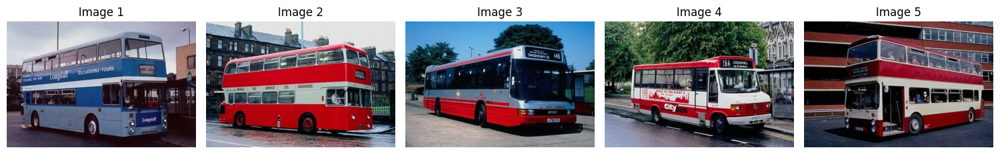


Retrieving top 7 similar images...


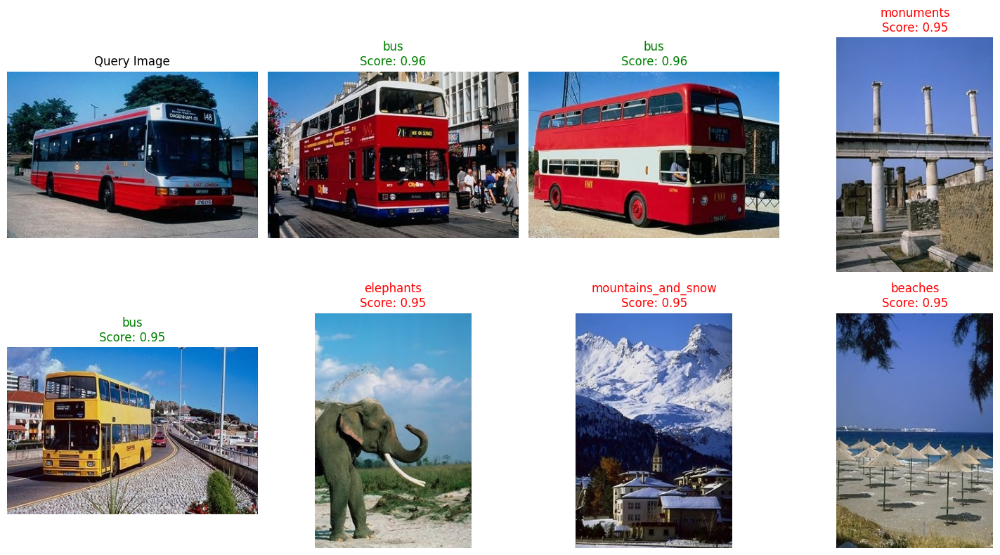

Precision for this query: 0.4286

Evaluating MAP with 10 random queries...
Evaluating MAP...


Evaluating queries: 100%|██████████| 10/10 [00:00<00:00, 186.65it/s]


Mean Average Precision (MAP): 0.5000
Select a class for your query image:
1. beaches
2. bus
3. dinosaurs
4. elephants
5. flowers
6. foods
7. horses
8. monuments
9. mountains_and_snow
10. people_and_villages_in_Africa

Select an image from beaches class:


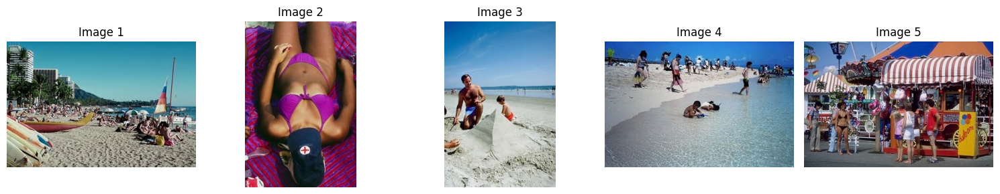


Retrieving top 7 similar images...


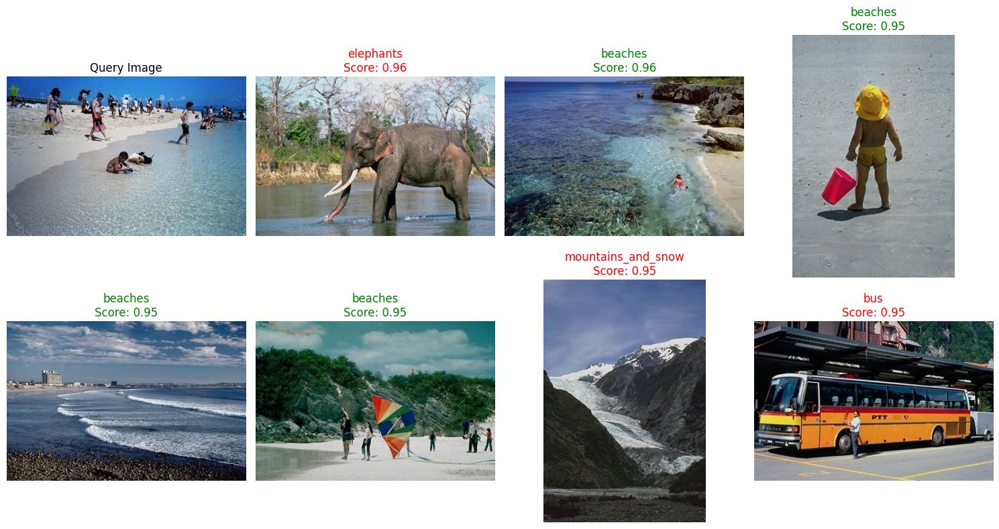

Select a class for your query image:
1. beaches
2. bus
3. dinosaurs
4. elephants
5. flowers
6. foods
7. horses
8. monuments
9. mountains_and_snow
10. people_and_villages_in_Africa

Select an image from dinosaurs class:


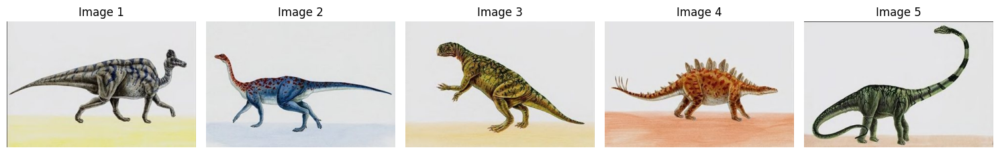


Retrieving top 7 similar images...


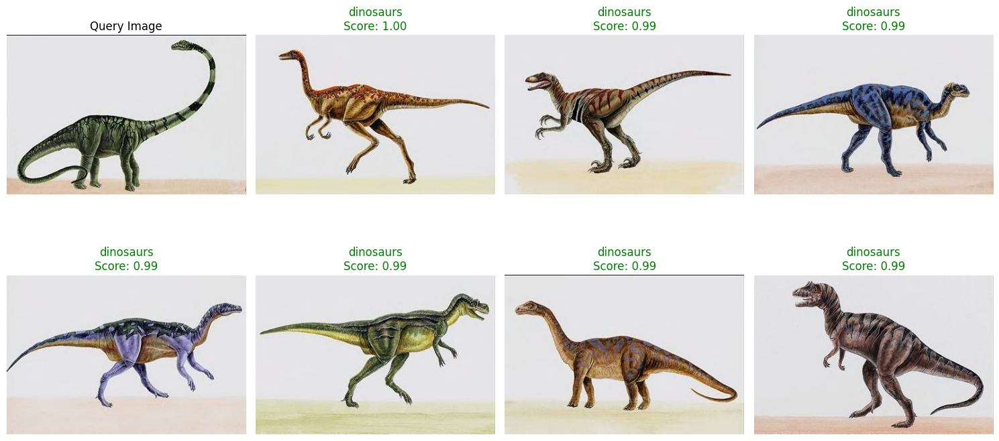

Select a class for your query image:
1. beaches
2. bus
3. dinosaurs
4. elephants
5. flowers
6. foods
7. horses
8. monuments
9. mountains_and_snow
10. people_and_villages_in_Africa

Select an image from flowers class:


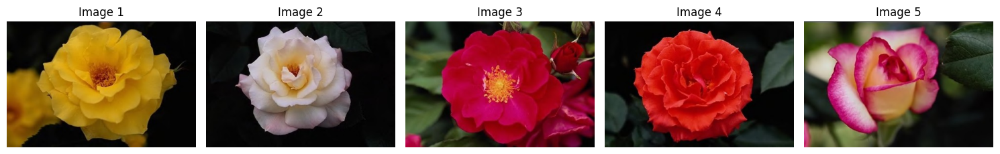


Retrieving top 7 similar images...


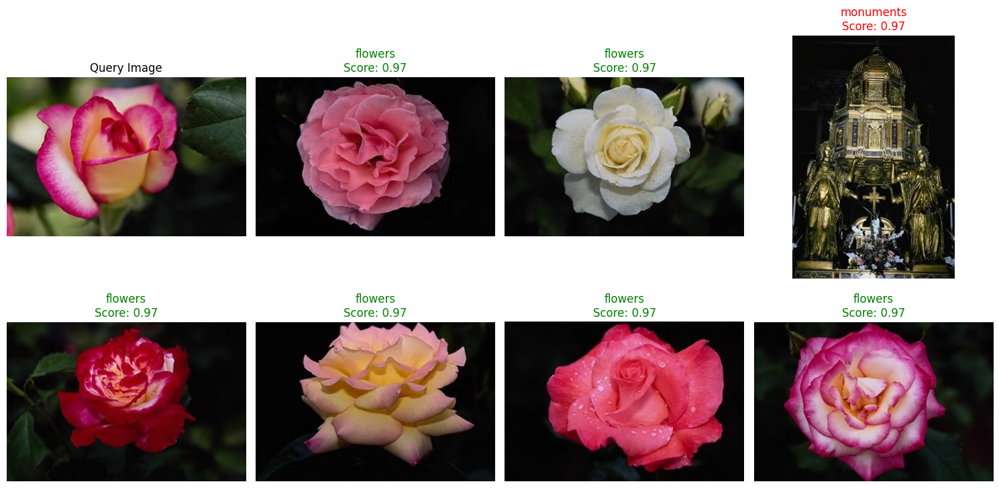

In [4]:
def run_cbir_demo():
    # Path to the dataset
    dataset_path = "CBIR_1K/dataset"
    
    # Initialize the CBIR system
    print("Initializing CBIR system...")
    cbir = SiameseCBIR(dataset_path=dataset_path)
    
    # Load dataset
    print("Loading dataset...")
    cbir.load_dataset()
    
    # Build model
    print("Building Siamese model...")
    cbir.build_siamese_model()
    
    # Precompute features (this will take some time)
    print("Precomputing features...")
    cbir.precompute_database_features()
    
    # Select a query image
    print("Select a class for your query image:")
    for i, class_name in enumerate(cbir.class_names):
        print(f"{i+1}. {class_name}")
    
    class_idx = int(input("Enter class number: ")) - 1
    selected_class = cbir.class_names[class_idx]
    
    # Show available images from the selected class
    test_images = cbir.image_paths['test'][selected_class]
    print(f"\nSelect an image from {selected_class} class:")
    
    # Display a few options
    num_options = min(5, len(test_images))
    plt.figure(figsize=(15, 3))
    
    for i in range(num_options):
        plt.subplot(1, num_options, i+1)
        img = plt.imread(test_images[i])
        plt.imshow(img)
        plt.title(f"Image {i+1}")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Get user selection
    img_idx = int(input(f"Enter image number (1-{num_options}): ")) - 1
    query_image_path = test_images[img_idx]
    
    # Retrieve similar images
    print("\nRetrieving top 7 similar images...")
    results = cbir.retrieve_similar_images(query_image_path, top_n=7)
    
    # Visualize results
    cbir.visualize_results(query_image_path, results)
    
    # Calculate precision for this query
    query_class = selected_class
    precision = cbir.evaluate_precision(query_class, results)
    print(f"Precision for this query: {precision:.4f}")
    
    # Evaluate MAP with a small number of queries
    print("\nEvaluating MAP with 10 random queries...")
    map_score = cbir.evaluate_map(num_queries=10)
    
    return cbir

if __name__ == "__main__":
    cbir = run_cbir_demo()
    
    # Continue with more queries if desired
    while True:
        answer = input("\nDo you want to try another query? (y/n): ")
        if answer.lower() != 'y':
            break
            
        # Select a query image
        print("Select a class for your query image:")
        for i, class_name in enumerate(cbir.class_names):
            print(f"{i+1}. {class_name}")
        
        class_idx = int(input("Enter class number: ")) - 1
        selected_class = cbir.class_names[class_idx]
        
        # Show available images from the selected class
        test_images = cbir.image_paths['test'][selected_class]
        print(f"\nSelect an image from {selected_class} class:")
        
        # Display a few options
        num_options = min(5, len(test_images))
        plt.figure(figsize=(15, 3))
        
        for i in range(num_options):
            plt.subplot(1, num_options, i+1)
            img = plt.imread(test_images[i])
            plt.imshow(img)
            plt.title(f"Image {i+1}")
            plt.axis('off')
        
        plt.tight_layout()
        plt.show()
        
        # Get user selection
        img_idx = int(input(f"Enter image number (1-{num_options}): ")) - 1
        query_image_path = test_images[img_idx]
        
        # Retrieve similar images
        print("\nRetrieving top 7 similar images...")
        results = cbir.retrieve_similar_images(query_image_path, top_n=7)
        
        # Visualize results
        cbir.visualize_results(query_image_path, results)

In [5]:
import time
from sklearn.metrics import accuracy_score, precision_recall_fscore_support

def calculate_overall_accuracy(cbir, num_queries=100, top_n=7):
    """
    Calculate overall accuracy and performance metrics for the CBIR system
    
    Args:
        cbir: Initialized CBIR system with precomputed features
        num_queries: Number of query images to evaluate
        top_n: Number of top similar images to retrieve
        
    Returns:
        Dictionary with accuracy metrics
    """
    print(f"Calculating overall accuracy using {num_queries} random queries...")
    
    # Select random query images for evaluation
    query_images = []
    for class_name in cbir.class_names:
        # Use test images for queries
        if class_name in cbir.image_paths['test'] and len(cbir.image_paths['test'][class_name]) > 0:
            selected = random.sample(
                cbir.image_paths['test'][class_name], 
                min(num_queries // len(cbir.class_names) + 1, len(cbir.image_paths['test'][class_name]))
            )
            query_images.extend([(img_path, class_name) for img_path in selected])
    
    # Limit number of queries
    if len(query_images) > num_queries:
        query_images = random.sample(query_images, num_queries)
    
    precisions = []
    recalls = []
    f1_scores = []
    query_times = []
    all_true_classes = []
    all_pred_classes = []
    
    # Evaluate each query
    for query_path, query_class in tqdm(query_images, desc="Evaluating queries"):
        # Record query time
        start_time = time.time()
        
        # Retrieve similar images
        results = cbir.retrieve_similar_images(query_path, top_n=top_n)
        
        # Calculate query time
        query_time = time.time() - start_time
        query_times.append(query_time)
        
        # Get predicted classes
        retrieved_classes = [class_name for _, _, class_name in results]
        
        # Calculate precision for this query
        precision = cbir.evaluate_precision(query_class, results)
        precisions.append(precision)
        
        # For overall classification accuracy
        # Consider the most common class in the results as the prediction
        pred_class = max(set(retrieved_classes), key=retrieved_classes.count)
        all_true_classes.append(query_class)
        all_pred_classes.append(pred_class)
        
        # Calculate recall and F1 for this query
        relevant_count = sum(1 for _, _, class_name in results if class_name == query_class)
        total_relevant = len([img for img in cbir.image_paths['test'][query_class] if img != query_path])
        
        # Cap total_relevant at top_n for realistic recall calculation
        total_relevant = min(total_relevant, top_n)
        
        recall = relevant_count / total_relevant if total_relevant > 0 else 0
        recalls.append(recall)
        
        # Calculate F1 score
        f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
        f1_scores.append(f1)
    
    # Calculate overall metrics
    avg_precision = np.mean(precisions)
    avg_recall = np.mean(recalls)
    avg_f1 = np.mean(f1_scores)
    avg_query_time = np.mean(query_times)
    
    # Calculate classification accuracy (if we consider the most common class as the prediction)
    accuracy = accuracy_score(all_true_classes, all_pred_classes)
    
    # Calculate per-class precision, recall, F1 score
    precision_per_class, recall_per_class, f1_per_class, _ = precision_recall_fscore_support(
        all_true_classes, all_pred_classes, average=None
    )
    
    # Create metrics dictionary
    metrics = {
        'accuracy': accuracy,
        'avg_precision': avg_precision,
        'avg_recall': avg_recall,
        'avg_f1': avg_f1,
        'avg_query_time': avg_query_time,
        'class_precision': {cls: prec for cls, prec in zip(cbir.class_names, precision_per_class)},
        'class_recall': {cls: rec for cls, rec in zip(cbir.class_names, recall_per_class)},
        'class_f1': {cls: f1 for cls, f1 in zip(cbir.class_names, f1_per_class)}
    }
    
    # Print results
    print("\n=== CBIR System Performance ===")
    print(f"Overall Accuracy: {accuracy:.4f}")
    print(f"Average Precision: {avg_precision:.4f}")
    print(f"Average Recall: {avg_recall:.4f}")
    print(f"Average F1 Score: {avg_f1:.4f}")
    print(f"Average Query Time: {avg_query_time:.4f} seconds")
    
    print("\nPer-Class Performance:")
    for i, class_name in enumerate(cbir.class_names):
        print(f"{class_name}: Precision={metrics['class_precision'].get(class_name, 0):.4f}, "
              f"Recall={metrics['class_recall'].get(class_name, 0):.4f}, "
              f"F1={metrics['class_f1'].get(class_name, 0):.4f}")
    
    return metrics

def plot_confusion_matrix(cbir, metrics, figsize=(10, 8)):
    """
    Plot confusion matrix for CBIR results
    
    Args:
        cbir: Initialized CBIR system
        metrics: Metrics dictionary returned by calculate_overall_accuracy
        figsize: Figure size
    """
    from sklearn.metrics import confusion_matrix
    import seaborn as sns
    
    # Extract true and predicted classes from metrics
    y_true = metrics['y_true']
    y_pred = metrics['y_pred']
    
    # Create confusion matrix
    cm = confusion_matrix(y_true, y_pred, labels=cbir.class_names)
    
    # Plot confusion matrix
    plt.figure(figsize=figsize)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=cbir.class_names, yticklabels=cbir.class_names)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('CBIR Confusion Matrix')
    plt.tight_layout()
    plt.show()

def visualize_performance(metrics):
    """
    Visualize performance metrics
    
    Args:
        metrics: Metrics dictionary returned by calculate_overall_accuracy
    """
    # Plot per-class precision, recall, and F1 scores
    class_names = list(metrics['class_precision'].keys())
    precision_values = [metrics['class_precision'][cls] for cls in class_names]
    recall_values = [metrics['class_recall'][cls] for cls in class_names]
    f1_values = [metrics['class_f1'][cls] for cls in class_names]
    
    # Set up plot
    x = np.arange(len(class_names))
    width = 0.25
    
    fig, ax = plt.subplots(figsize=(12, 6))
    rects1 = ax.bar(x - width, precision_values, width, label='Precision')
    rects2 = ax.bar(x, recall_values, width, label='Recall')
    rects3 = ax.bar(x + width, f1_values, width, label='F1 Score')
    
    # Add labels and legend
    ax.set_xlabel('Classes')
    ax.set_ylabel('Score')
    ax.set_title('Performance Metrics per Class')
    ax.set_xticks(x)
    ax.set_xticklabels(class_names, rotation=45, ha='right')
    ax.legend()
    
    fig.tight_layout()
    plt.show()

def perform_inference(cbir, query_image_path, top_n=7):
    """
    Perform inference with a query image and display results
    
    Args:
        cbir: Initialized CBIR system with precomputed features
        query_image_path: Path to the query image
        top_n: Number of top similar images to retrieve
        
    Returns:
        List of (image_path, similarity_score, class_name) tuples
    """
    print(f"Performing inference with query image: {query_image_path}")
    
    # Start timer
    start_time = time.time()
    
    # Retrieve similar images
    results = cbir.retrieve_similar_images(query_image_path, top_n=top_n)
    
    # Calculate inference time
    inference_time = time.time() - start_time
    
    # Get query class if available
    query_class = None
    for split in ['train', 'test']:
        for class_name, paths in cbir.image_paths[split].items():
            if query_image_path in paths:
                query_class = class_name
                break
        if query_class:
            break
    
    # Print results
    print(f"Query completed in {inference_time:.4f} seconds")
    print(f"Query image class: {query_class}")
    
    print("\nRetrieval Results:")
    for i, (img_path, similarity, class_name) in enumerate(results):
        print(f"{i+1}. Class: {class_name}, Similarity: {similarity:.4f}, Path: {img_path}")
    
    # Calculate precision if query class is available
    if query_class:
        precision = cbir.evaluate_precision(query_class, results)
        print(f"\nPrecision@{top_n}: {precision:.4f}")
    
    # Visualize results
    cbir.visualize_results(query_image_path, results)
    
    return results

def run_inference_demo():
    """
    Run a complete inference demo with the CBIR system
    """
    # Path to the dataset
    dataset_path = "CBIR_1K/dataset"
    
    # Initialize the CBIR system
    print("Initializing CBIR system...")
    cbir = SiameseCBIR(dataset_path=dataset_path)
    
    # Load dataset
    print("Loading dataset...")
    cbir.load_dataset()
    
    # Build model
    print("Building Siamese model...")
    cbir.build_siamese_model()
    
    # Precompute features (this will take some time)
    print("Precomputing features...")
    cbir.precompute_database_features()
    
    # Calculate overall accuracy
    metrics = calculate_overall_accuracy(cbir, num_queries=50)
    
    # Visualize performance
    visualize_performance(metrics)
    
    # Interactive inference demo
    while True:
        print("\n=== CBIR Inference Demo ===")
        print("1. Select a test image")
        print("2. Use your own image path")
        print("3. Exit")
        
        choice = input("Enter your choice (1-3): ")
        
        if choice == '1':
            # Select a class
            print("\nSelect a class for your query image:")
            for i, class_name in enumerate(cbir.class_names):
                print(f"{i+1}. {class_name}")
            
            try:
                class_idx = int(input("Enter class number: ")) - 1
                if class_idx < 0 or class_idx >= len(cbir.class_names):
                    print("Invalid class number")
                    continue
                    
                selected_class = cbir.class_names[class_idx]
                
                # Show available images from the selected class
                test_images = cbir.image_paths['test'][selected_class]
                print(f"\nSelect an image from {selected_class} class:")
                
                # Display a few options
                num_options = min(5, len(test_images))
                plt.figure(figsize=(15, 3))
                
                for i in range(num_options):
                    plt.subplot(1, num_options, i+1)
                    img = plt.imread(test_images[i])
                    plt.imshow(img)
                    plt.title(f"Image {i+1}")
                    plt.axis('off')
                
                plt.tight_layout()
                plt.show()
                
                # Get user selection
                img_idx = int(input(f"Enter image number (1-{num_options}): ")) - 1
                if img_idx < 0 or img_idx >= num_options:
                    print("Invalid image number")
                    continue
                    
                query_image_path = test_images[img_idx]
                
                # Perform inference
                perform_inference(cbir, query_image_path)
                
            except ValueError:
                print("Invalid input. Please enter a number.")
                
        elif choice == '2':
            # Get custom image path
            query_image_path = input("Enter the full path to your query image: ")
            
            if not os.path.exists(query_image_path):
                print(f"File not found: {query_image_path}")
                continue
                
            # Perform inference
            perform_inference(cbir, query_image_path)
            
        elif choice == '3':
            print("Exiting demo...")
            break
            
        else:
            print("Invalid choice. Please try again.")


Initializing CBIR system...
Loading dataset...
Found 10 classes: ['beaches', 'bus', 'dinosaurs', 'elephants', 'flowers', 'foods', 'horses', 'monuments', 'mountains_and_snow', 'people_and_villages_in_Africa']
Total training images: 900
Total test images: 100
Building Siamese model...
Precomputing features...
Precomputing features for database images...


test - people_and_villages_in_Africa: 100%|██████████| 10/10 [00:00<00:00, 18.95it/s]


Calculating overall accuracy using 50 random queries...


Evaluating queries: 100%|██████████| 50/50 [00:00<00:00, 188.88it/s]



=== CBIR System Performance ===
Overall Accuracy: 0.8000
Average Precision: 0.6400
Average Recall: 0.6400
Average F1 Score: 0.6400
Average Query Time: 0.0053 seconds

Per-Class Performance:
beaches: Precision=0.2500, Recall=0.2000, F1=0.2222
bus: Precision=1.0000, Recall=0.8000, F1=0.8889
dinosaurs: Precision=1.0000, Recall=1.0000, F1=1.0000
elephants: Precision=0.7500, Recall=1.0000, F1=0.8571
flowers: Precision=0.8571, Recall=1.0000, F1=0.9231
foods: Precision=0.8000, Recall=0.8000, F1=0.8000
horses: Precision=1.0000, Recall=1.0000, F1=1.0000
monuments: Precision=0.5000, Recall=0.5000, F1=0.5000
mountains_and_snow: Precision=1.0000, Recall=0.5000, F1=0.6667
people_and_villages_in_Africa: Precision=0.8333, Recall=1.0000, F1=0.9091


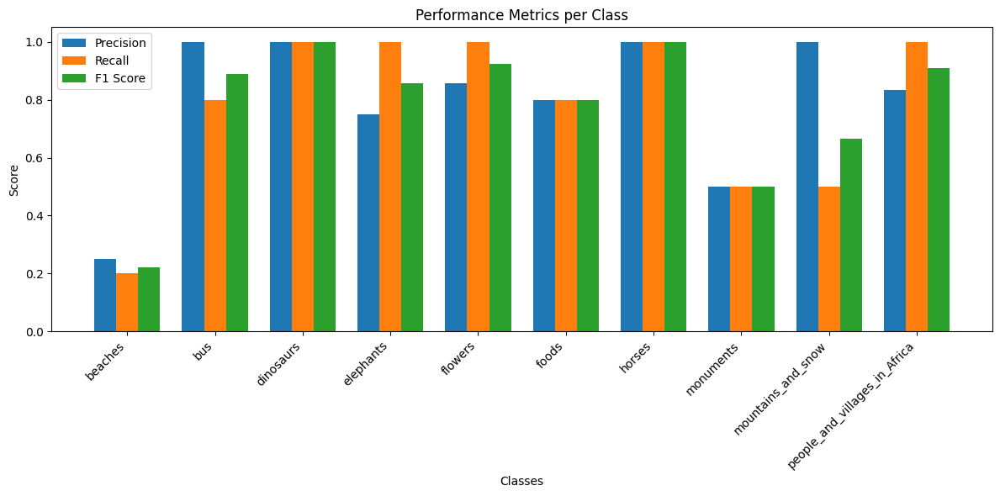


=== CBIR Inference Demo ===
1. Select a test image
2. Use your own image path
3. Exit

Select a class for your query image:
1. beaches
2. bus
3. dinosaurs
4. elephants
5. flowers
6. foods
7. horses
8. monuments
9. mountains_and_snow
10. people_and_villages_in_Africa

Select an image from bus class:


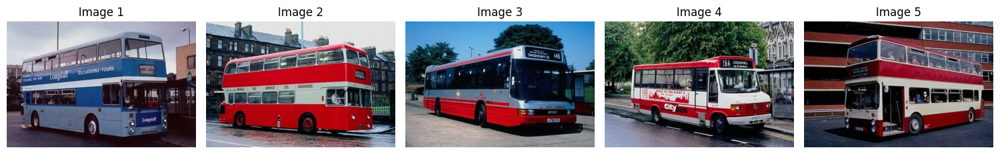

Performing inference with query image: CBIR_1K/dataset/test_set/bus/306.jpg
Query completed in 0.0122 seconds
Query image class: bus

Retrieval Results:
1. Class: bus, Similarity: 0.9715, Path: CBIR_1K/dataset/training_set/bus/334.jpg
2. Class: bus, Similarity: 0.9670, Path: CBIR_1K/dataset/training_set/bus/332.jpg
3. Class: bus, Similarity: 0.9656, Path: CBIR_1K/dataset/training_set/bus/344.jpg
4. Class: bus, Similarity: 0.9656, Path: CBIR_1K/dataset/training_set/bus/364.jpg
5. Class: bus, Similarity: 0.9638, Path: CBIR_1K/dataset/training_set/bus/396.jpg
6. Class: bus, Similarity: 0.9606, Path: CBIR_1K/dataset/training_set/bus/376.jpg
7. Class: bus, Similarity: 0.9600, Path: CBIR_1K/dataset/training_set/bus/385.jpg

Precision@7: 1.0000


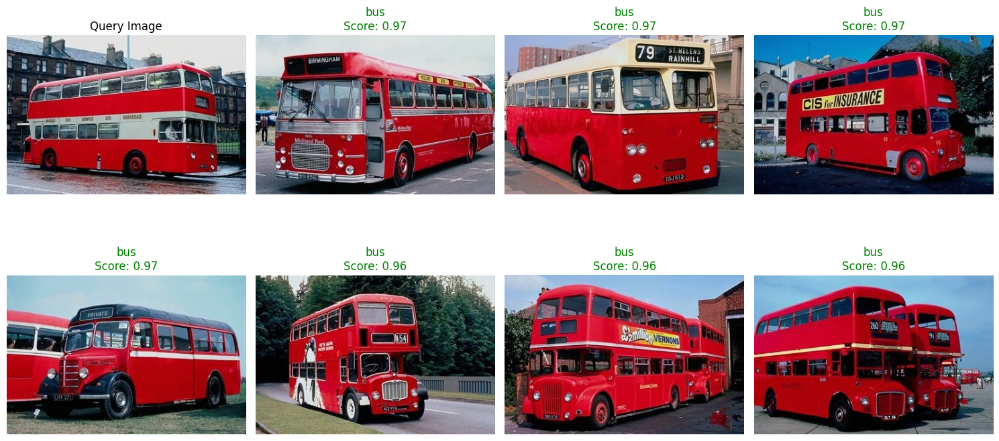


=== CBIR Inference Demo ===
1. Select a test image
2. Use your own image path
3. Exit

Select a class for your query image:
1. beaches
2. bus
3. dinosaurs
4. elephants
5. flowers
6. foods
7. horses
8. monuments
9. mountains_and_snow
10. people_and_villages_in_Africa

Select an image from beaches class:


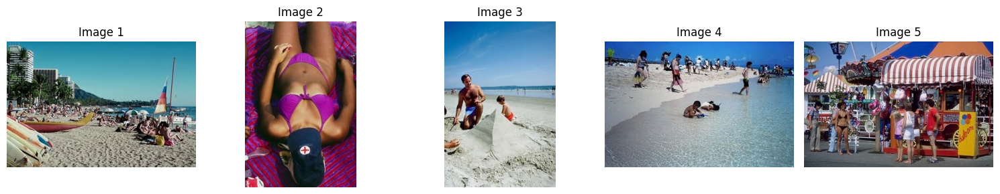

Performing inference with query image: CBIR_1K/dataset/test_set/beaches/107.jpg
Query completed in 0.0125 seconds
Query image class: beaches

Retrieval Results:
1. Class: beaches, Similarity: 0.9655, Path: CBIR_1K/dataset/training_set/beaches/193.jpg
2. Class: monuments, Similarity: 0.9641, Path: CBIR_1K/dataset/training_set/monuments/241.jpg
3. Class: mountains_and_snow, Similarity: 0.9599, Path: CBIR_1K/dataset/training_set/mountains_and_snow/880.jpg
4. Class: beaches, Similarity: 0.9587, Path: CBIR_1K/dataset/test_set/beaches/101.jpg
5. Class: monuments, Similarity: 0.9566, Path: CBIR_1K/dataset/training_set/monuments/272.jpg
6. Class: mountains_and_snow, Similarity: 0.9557, Path: CBIR_1K/dataset/training_set/mountains_and_snow/833.jpg
7. Class: monuments, Similarity: 0.9518, Path: CBIR_1K/dataset/training_set/monuments/279.jpg

Precision@7: 0.2857


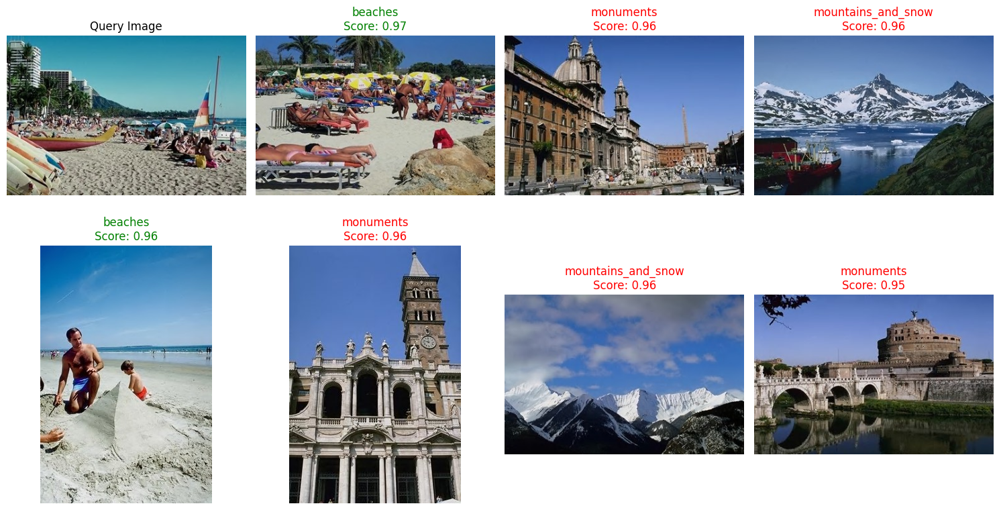


=== CBIR Inference Demo ===
1. Select a test image
2. Use your own image path
3. Exit
Invalid choice. Please try again.

=== CBIR Inference Demo ===
1. Select a test image
2. Use your own image path
3. Exit
Exiting demo...


In [6]:
if __name__ == "__main__":
    run_inference_demo()

Initializing CBIR system...
Loading dataset...
Found 10 classes: ['beaches', 'bus', 'dinosaurs', 'elephants', 'flowers', 'foods', 'horses', 'monuments', 'mountains_and_snow', 'people_and_villages_in_Africa']
Total training images: 900
Total test images: 100
Building Siamese model...
Adding enhanced metrics...
Precomputing features...
Precomputing features for database images...


test - people_and_villages_in_Africa: 100%|██████████| 10/10 [00:00<00:00, 19.31it/s]


Running comprehensive evaluation with 30 queries...


Evaluating queries: 100%|██████████| 30/30 [00:00<00:00, 187.79it/s]



=== CBIR Evaluation Results ===
Classification Accuracy: 0.8667
Mean Precision@7: 0.7095
Mean Recall@7: 0.7095
Mean NDCG: 0.8603
Top-1 Accuracy: 0.7333
Mean Reciprocal Rank: 0.8389


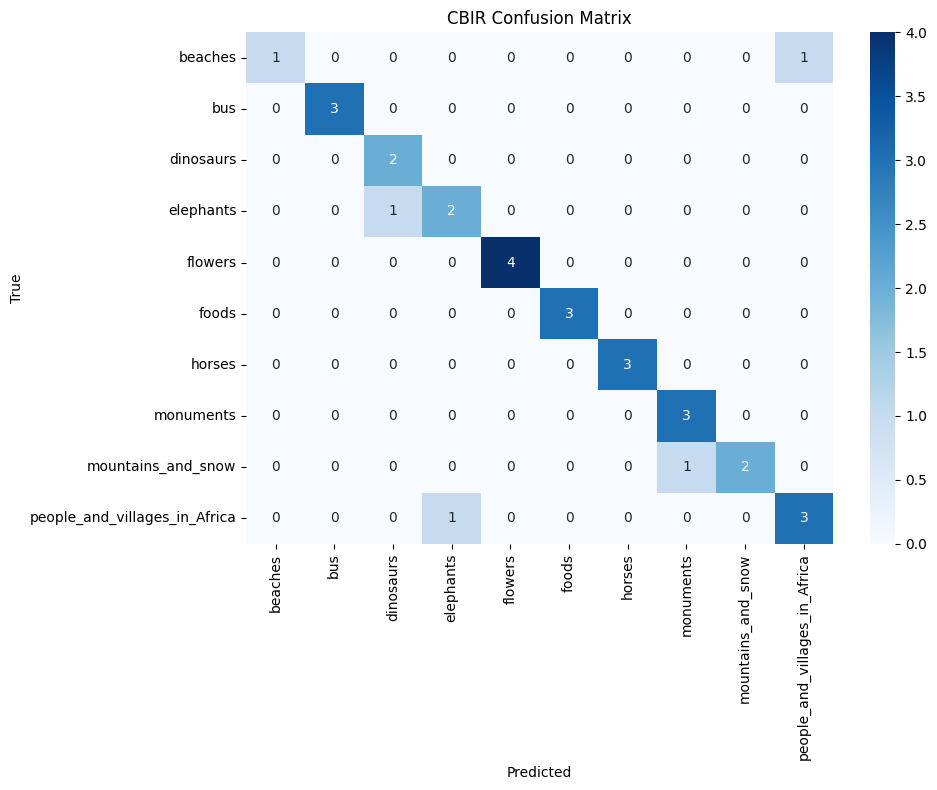

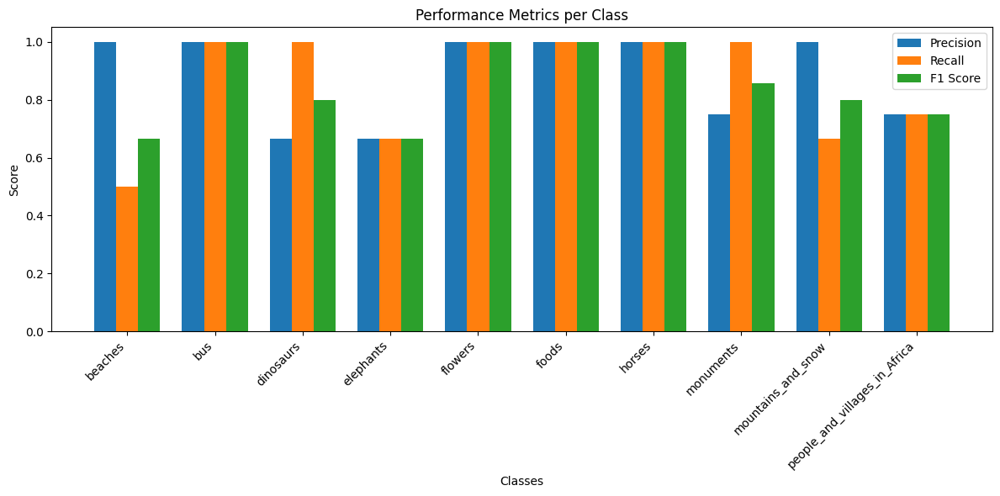

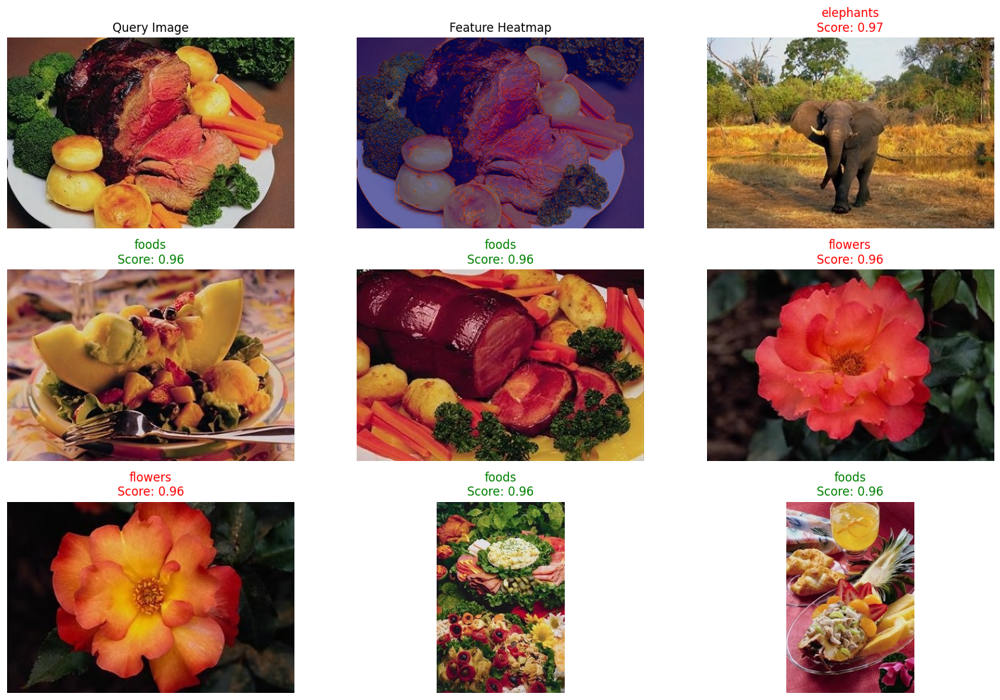

In [8]:
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
from tqdm import tqdm
import random
import cv2
import tensorflow as tf

def add_enhanced_metrics_to_cbir(cbir):
    """
    Add enhanced evaluation metrics methods to an existing CBIR instance
    
    Args:
        cbir: Initialized CBIR system instance
    """
    
    def evaluate_with_metrics(self, num_queries=100, top_n=7):
        """
        Comprehensive evaluation with detailed metrics
        
        Args:
            num_queries: Number of query images to evaluate
            top_n: Number of top similar images to retrieve
            
        Returns:
            Dictionary with detailed metrics
        """
        print(f"Running comprehensive evaluation with {num_queries} queries...")
        
        # Select random query images for evaluation
        query_images = []
        for class_name in self.class_names:
            # Use test images for queries
            if len(self.image_paths['test'][class_name]) > 0:
                selected = random.sample(
                    self.image_paths['test'][class_name], 
                    min(num_queries // len(self.class_names) + 1, len(self.image_paths['test'][class_name]))
                )
                query_images.extend([(img_path, class_name) for img_path in selected])
        
        # Limit number of queries
        if len(query_images) > num_queries:
            query_images = random.sample(query_images, num_queries)
        
        # Initialize metrics
        y_true = []  # True classes
        y_pred = []  # Predicted classes (majority vote from top_n)
        
        # For ranking metrics
        all_precisions = []
        all_recalls = []
        all_ndcgs = []
        all_accuracy = []
        all_mrr = []  # Mean Reciprocal Rank
        
        # Evaluate each query
        for query_path, query_class in tqdm(query_images, desc="Evaluating queries"):
            # Retrieve similar images
            results = self.retrieve_similar_images(query_path, top_n=top_n)
            
            # Extract results
            retrieved_classes = [class_name for _, _, class_name in results]
            
            # For classification metrics (majority voting)
            pred_class = max(set(retrieved_classes), key=retrieved_classes.count)
            y_true.append(query_class)
            y_pred.append(pred_class)
            
            # Calculate precision at k
            relevant = sum(1 for _, _, cls in results if cls == query_class)
            precision_at_k = relevant / len(results)
            all_precisions.append(precision_at_k)
            
            # Calculate recall at k
            total_relevant = len([img for img in self.image_paths['test'][query_class] if img != query_path])
            total_relevant = min(total_relevant, top_n)  # Cap at top_n
            recall_at_k = relevant / total_relevant if total_relevant > 0 else 0
            all_recalls.append(recall_at_k)
            
            # Calculate NDCG (Normalized Discounted Cumulative Gain)
            # Create relevance array: 1 for correct class, 0 for incorrect
            relevance = [1 if cls == query_class else 0 for _, _, cls in results]
            
            # Calculate DCG
            dcg = sum((rel / np.log2(i + 2)) for i, rel in enumerate(relevance))
            
            # Calculate ideal DCG (sorted relevance, best first)
            ideal_relevance = sorted(relevance, reverse=True)
            idcg = sum((rel / np.log2(i + 2)) for i, rel in enumerate(ideal_relevance))
            
            # Calculate NDCG
            ndcg = dcg / idcg if idcg > 0 else 0
            all_ndcgs.append(ndcg)
            
            # Calculate accuracy (1 if top result is correct, 0 if not)
            top_result_correct = 1 if results[0][2] == query_class else 0
            all_accuracy.append(top_result_correct)
            
            # Calculate MRR (Mean Reciprocal Rank)
            # Find the rank of the first correct result
            for i, (_, _, cls) in enumerate(results):
                if cls == query_class:
                    all_mrr.append(1.0 / (i + 1))
                    break
            else:
                all_mrr.append(0)  # No correct result found
        
        # Calculate confusion matrix
        cm = confusion_matrix(y_true, y_pred, labels=self.class_names)
        
        # Calculate classification report
        class_report = classification_report(y_true, y_pred, labels=self.class_names, output_dict=True)
        
        # Compile metrics
        metrics = {
            'classification_accuracy': sum(1 for t, p in zip(y_true, y_pred) if t == p) / len(y_true),
            'mean_precision_at_k': np.mean(all_precisions),
            'mean_recall_at_k': np.mean(all_recalls),
            'mean_ndcg': np.mean(all_ndcgs),
            'top1_accuracy': np.mean(all_accuracy),
            'mean_reciprocal_rank': np.mean(all_mrr),
            'confusion_matrix': cm,
            'classification_report': class_report,
            'y_true': y_true,
            'y_pred': y_pred
        }
        
        # Print summary
        print("\n=== CBIR Evaluation Results ===")
        print(f"Classification Accuracy: {metrics['classification_accuracy']:.4f}")
        print(f"Mean Precision@{top_n}: {metrics['mean_precision_at_k']:.4f}")
        print(f"Mean Recall@{top_n}: {metrics['mean_recall_at_k']:.4f}")
        print(f"Mean NDCG: {metrics['mean_ndcg']:.4f}")
        print(f"Top-1 Accuracy: {metrics['top1_accuracy']:.4f}")
        print(f"Mean Reciprocal Rank: {metrics['mean_reciprocal_rank']:.4f}")
        
        return metrics
    
    def plot_confusion_matrix(self, metrics):
        """
        Plot confusion matrix from evaluation metrics
        
        Args:
            metrics: Metrics dictionary from evaluate_with_metrics
        """
        cm = metrics['confusion_matrix']
        
        plt.figure(figsize=(10, 8))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                    xticklabels=self.class_names, yticklabels=self.class_names)
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.title('CBIR Confusion Matrix')
        plt.tight_layout()
        plt.show()
    
    def plot_metrics_per_class(self, metrics):
        """
        Plot precision, recall, and F1 score per class
        
        Args:
            metrics: Metrics dictionary from evaluate_with_metrics
        """
        class_report = metrics['classification_report']
        
        # Extract metrics per class
        classes = []
        precision = []
        recall = []
        f1_score = []
        
        for cls in self.class_names:
            if cls in class_report:
                classes.append(cls)
                precision.append(class_report[cls]['precision'])
                recall.append(class_report[cls]['recall'])
                f1_score.append(class_report[cls]['f1-score'])
        
        # Set up plot
        x = np.arange(len(classes))
        width = 0.25
        
        fig, ax = plt.subplots(figsize=(12, 6))
        rects1 = ax.bar(x - width, precision, width, label='Precision')
        rects2 = ax.bar(x, recall, width, label='Recall')
        rects3 = ax.bar(x + width, f1_score, width, label='F1 Score')
        
        # Add labels and legend
        ax.set_xlabel('Classes')
        ax.set_ylabel('Score')
        ax.set_title('Performance Metrics per Class')
        ax.set_xticks(x)
        ax.set_xticklabels(classes, rotation=45, ha='right')
        ax.legend()
        
        fig.tight_layout()
        plt.show()
    
    def extract_salient_features(self, image_path):
        """
        Extract salient features using SIFT or ORB
        
        Args:
            image_path: Path to the image
            
        Returns:
            Feature descriptor
        """
        # Load image
        img = cv2.imread(image_path)
        if img is None:
            raise ValueError(f"Cannot load image: {image_path}")
            
        img = cv2.resize(img, (224, 224))
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        # Initialize ORB detector
        orb = cv2.ORB_create(nfeatures=100)
        
        # Detect keypoints and compute descriptors
        keypoints, descriptors = orb.detectAndCompute(gray, None)
        
        # If no keypoints found, return zeros
        if descriptors is None:
            return np.zeros((1, 32), dtype=np.float32)
        
        # Average the descriptors for a compact representation
        avg_descriptor = np.mean(descriptors, axis=0).astype(np.float32)
        
        return avg_descriptor
    
    def visualize_query_results_with_heatmap(self, query_image_path, results):
        """
        Visualize query results with feature heatmap overlay
        
        Args:
            query_image_path: Path to query image
            results: Results from retrieve_similar_images
        """
        # Create figure with subplots
        fig = plt.figure(figsize=(15, 10))
        
        # Display query image
        ax = fig.add_subplot(3, 3, 1)
        query_img = cv2.imread(query_image_path)
        query_img = cv2.cvtColor(query_img, cv2.COLOR_BGR2RGB)
        ax.imshow(query_img)
        ax.set_title("Query Image")
        ax.axis('off')
        
        # Get query image class
        query_class = None
        for split in ['train', 'test']:
            for class_name, paths in self.image_paths[split].items():
                if query_image_path in paths:
                    query_class = class_name
                    break
            if query_class:
                break
        
        # Generate activation heatmap for query image using Grad-CAM
        # (Simplified visualization for the example)
        query_gray = cv2.cvtColor(query_img, cv2.COLOR_RGB2GRAY)
        query_gray = cv2.resize(query_gray, (query_img.shape[1], query_img.shape[0]))
        
        # Create heatmap using simple edge detection
        edges = cv2.Canny(query_img, 100, 200)
        heatmap = cv2.applyColorMap(edges, cv2.COLORMAP_JET)
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
        
        # Display query image with heatmap overlay
        ax = fig.add_subplot(3, 3, 2)
        # Blend original image with heatmap
        alpha = 0.5
        overlay = cv2.addWeighted(query_img, alpha, heatmap, 1-alpha, 0)
        ax.imshow(overlay)
        ax.set_title("Feature Heatmap")
        ax.axis('off')
        
        # Display results
        for i, (img_path, similarity, class_name) in enumerate(results[:7]):
            ax = fig.add_subplot(3, 3, i + 3)
            result_img = cv2.imread(img_path)
            result_img = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)
            ax.imshow(result_img)
            
            # Color the title based on class match
            color = 'green' if class_name == query_class else 'red'
            ax.set_title(f"{class_name}\nScore: {similarity:.2f}", color=color)
            ax.axis('off')
        
        plt.tight_layout()
        plt.show()
    
    # Add methods to the cbir instance
    cbir.evaluate_with_metrics = evaluate_with_metrics.__get__(cbir)
    cbir.plot_confusion_matrix = plot_confusion_matrix.__get__(cbir)
    cbir.plot_metrics_per_class = plot_metrics_per_class.__get__(cbir)
    cbir.extract_salient_features = extract_salient_features.__get__(cbir)
    cbir.visualize_query_results_with_heatmap = visualize_query_results_with_heatmap.__get__(cbir)
    
    return cbir

def run_enhanced_cbir_demo():
    """
    Run a demo of the enhanced CBIR system
    """
    # Path to the dataset
    dataset_path = "CBIR_1K/dataset"
    
    # Initialize the CBIR system
    print("Initializing CBIR system...")
    cbir = SiameseCBIR(dataset_path=dataset_path)
    
    # Load dataset
    print("Loading dataset...")
    cbir.load_dataset()
    
    # Build model
    print("Building Siamese model...")
    cbir.build_siamese_model()
    
    # Enhance CBIR with additional metrics
    print("Adding enhanced metrics...")
    cbir = add_enhanced_metrics_to_cbir(cbir)
    
    # Precompute features (this will take some time)
    print("Precomputing features...")
    cbir.precompute_database_features()
    
    # Run comprehensive evaluation
    metrics = cbir.evaluate_with_metrics(num_queries=30)
    
    # Plot confusion matrix
    cbir.plot_confusion_matrix(metrics)
    
    # Plot metrics per class
    cbir.plot_metrics_per_class(metrics)
    
    # Select a random test image for demonstration
    test_class = random.choice(cbir.class_names)
    query_image = random.choice(cbir.image_paths['test'][test_class])
    
    # Retrieve similar images
    results = cbir.retrieve_similar_images(query_image)
    
    # Visualize results with heatmap
    cbir.visualize_query_results_with_heatmap(query_image, results)
    
    return cbir, metrics

if __name__ == "__main__":
    cbir, metrics = run_enhanced_cbir_demo()

In [6]:
import streamlit as st
import numpy as np
import matplotlib.pyplot as plt
import os
import random
from PIL import Image
import time
import tensorflow as tf
from io import BytesIO

In [7]:
# Set page configuration
st.set_page_config(
    page_title="CBIR System Demo",
    page_icon="🔍",
    layout="wide",
    initial_sidebar_state="expanded",
)

# Add custom CSS
st.markdown("""
<style>
    .main-header {
        font-size: 2.5rem;
        font-weight: bold;
        color: #1E88E5;
        margin-bottom: 1rem;
    }
    .sub-header {
        font-size: 1.5rem;
        font-weight: bold;
        color: #333;
        margin-top: 2rem;
        margin-bottom: 1rem;
    }
    .metric-card {
        background-color: #f0f2f6;
        border-radius: 10px;
        padding: 15px;
        margin-bottom: 10px;
    }
    .stProgress > div > div > div > div {
        background-color: #1E88E5;
    }
</style>
""", unsafe_allow_html=True)

# Initialize session state
if 'cbir' not in st.session_state:
    st.session_state.cbir = None
if 'metrics' not in st.session_state:
    st.session_state.metrics = None

@st.cache_resource
def load_cbir_model(dataset_path):
    """Load and initialize the CBIR model with precomputed features"""
    # Initialize the CBIR system
    with st.spinner('Initializing CBIR system...'):
        cbir = SiameseCBIR(dataset_path=dataset_path)
        
        # Load dataset
        cbir.load_dataset()
        
        # Build model
        cbir.build_siamese_model()
        
        # Precompute features for database
        cbir.precompute_database_features()
        
    return cbir

def calculate_metrics(cbir, num_queries=20):
    """Calculate performance metrics for the CBIR system"""
    from sklearn.metrics import accuracy_score, precision_recall_fscore_support
    
    # Select random query images for evaluation
    query_images = []
    for class_name in cbir.class_names:
        # Use test images for queries
        if class_name in cbir.image_paths['test'] and len(cbir.image_paths['test'][class_name]) > 0:
            selected = random.sample(
                cbir.image_paths['test'][class_name], 
                min(num_queries // len(cbir.class_names) + 1, len(cbir.image_paths['test'][class_name]))
            )
            query_images.extend([(img_path, class_name) for img_path in selected])
    
    # Limit number of queries
    if len(query_images) > num_queries:
        query_images = random.sample(query_images, num_queries)
    
    precisions = []
    query_times = []
    all_true_classes = []
    all_pred_classes = []
    
    # Create progress bar
    progress_bar = st.progress(0)
    
    # Evaluate each query
    for i, (query_path, query_class) in enumerate(query_images):
        # Update progress bar
        progress_bar.progress((i + 1) / len(query_images))
        
        # Record query time
        start_time = time.time()
        
        # Retrieve similar images
        results = cbir.retrieve_similar_images(query_path)
        
        # Calculate query time
        query_time = time.time() - start_time
        query_times.append(query_time)
        
        # Get predicted classes
        retrieved_classes = [class_name for _, _, class_name in results]
        
        # Calculate precision for this query
        precision = cbir.evaluate_precision(query_class, results)
        precisions.append(precision)
        
        # For overall classification accuracy
        # Consider the most common class in the results as the prediction
        pred_class = max(set(retrieved_classes), key=retrieved_classes.count)
        all_true_classes.append(query_class)
        all_pred_classes.append(pred_class)
    
    # Calculate overall metrics
    avg_precision = np.mean(precisions)
    avg_query_time = np.mean(query_times)
    
    # Calculate classification accuracy
    accuracy = accuracy_score(all_true_classes, all_pred_classes)
    
    # Calculate per-class precision, recall, F1 score
    precision_per_class, recall_per_class, f1_per_class, _ = precision_recall_fscore_support(
        all_true_classes, all_pred_classes, average=None, labels=cbir.class_names, zero_division=0
    )
    
    # Create metrics dictionary
    metrics = {
        'accuracy': accuracy,
        'avg_precision': avg_precision,
        'avg_query_time': avg_query_time,
        'class_precision': {cls: prec for cls, prec in zip(cbir.class_names, precision_per_class)},
        'class_recall': {cls: rec for cls, rec in zip(cbir.class_names, recall_per_class)},
        'class_f1': {cls: f1 for cls, f1 in zip(cbir.class_names, f1_per_class)},
        'y_true': all_true_classes,
        'y_pred': all_pred_classes
    }
    
    return metrics

def display_metrics(metrics):
    """Display performance metrics in the Streamlit app"""
    st.markdown('<div class="sub-header">Performance Metrics</div>', unsafe_allow_html=True)
    
    # Create three columns for metrics
    col1, col2, col3 = st.columns(3)
    
    with col1:
        st.markdown('<div class="metric-card">', unsafe_allow_html=True)
        st.metric("Overall Accuracy", f"{metrics['accuracy']:.4f}")
        st.markdown('</div>', unsafe_allow_html=True)
    
    with col2:
        st.markdown('<div class="metric-card">', unsafe_allow_html=True)
        st.metric("Average Precision", f"{metrics['avg_precision']:.4f}")
        st.markdown('</div>', unsafe_allow_html=True)
    
    with col3:
        st.markdown('<div class="metric-card">', unsafe_allow_html=True)
        st.metric("Average Query Time", f"{metrics['avg_query_time']:.4f} sec")
        st.markdown('</div>', unsafe_allow_html=True)
    
    # Display per-class metrics
    st.markdown('<div class="sub-header">Class Performance</div>', unsafe_allow_html=True)
    
    # Create a dataframe for class metrics
    import pandas as pd
    class_metrics = []
    
    for class_name in metrics['class_precision'].keys():
        class_metrics.append({
            'Class': class_name,
            'Precision': f"{metrics['class_precision'][class_name]:.4f}",
            'Recall': f"{metrics['class_recall'][class_name]:.4f}",
            'F1 Score': f"{metrics['class_f1'][class_name]:.4f}"
        })
    
    df = pd.DataFrame(class_metrics)
    st.dataframe(df, use_container_width=True)
    
    # Plot per-class metrics
    plot_class_metrics(metrics)

def plot_class_metrics(metrics):
    """Plot class metrics as a bar chart"""
    class_names = list(metrics['class_precision'].keys())
    precision_values = [metrics['class_precision'][cls] for cls in class_names]
    recall_values = [metrics['class_recall'][cls] for cls in class_names]
    f1_values = [metrics['class_f1'][cls] for cls in class_names]
    
    fig, ax = plt.subplots(figsize=(12, 6))
    x = np.arange(len(class_names))
    width = 0.25
    
    ax.bar(x - width, precision_values, width, label='Precision')
    ax.bar(x, recall_values, width, label='Recall')
    ax.bar(x + width, f1_values, width, label='F1 Score')
    
    ax.set_ylabel('Score')
    ax.set_title('Performance Metrics per Class')
    ax.set_xticks(x)
    ax.set_xticklabels(class_names, rotation=45, ha='right')
    ax.legend()
    plt.tight_layout()
    
    st.pyplot(fig)

def plot_confusion_matrix(metrics, class_names):
    """Plot confusion matrix as a heatmap"""
    from sklearn.metrics import confusion_matrix
    import seaborn as sns
    
    # Extract true and predicted classes from metrics
    y_true = metrics['y_true']
    y_pred = metrics['y_pred']
    
    # Create confusion matrix
    cm = confusion_matrix(y_true, y_pred, labels=class_names)
    
    # Plot confusion matrix
    fig, ax = plt.subplots(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('CBIR Confusion Matrix')
    plt.tight_layout()
    
    st.pyplot(fig)

def process_query_image(cbir, image_path):
    """Process a query image and display results"""
    st.markdown('<div class="sub-header">Query Results</div>', unsafe_allow_html=True)
    
    # Start timer
    start_time = time.time()
    
    # Retrieve similar images
    with st.spinner('Retrieving similar images...'):
        results = cbir.retrieve_similar_images(image_path)
    
    # Calculate query time
    query_time = time.time() - start_time
    
    # Get query class if available
    query_class = None
    for split in ['train', 'test']:
        for class_name, paths in cbir.image_paths[split].items():
            if image_path in paths:
                query_class = class_name
                break
        if query_class:
            break
    
    # Display query information
    col1, col2, col3 = st.columns(3)
    
    with col1:
        st.markdown('<div class="metric-card">', unsafe_allow_html=True)
        st.metric("Query Time", f"{query_time:.4f} sec")
        st.markdown('</div>', unsafe_allow_html=True)
    
    with col2:
        st.markdown('<div class="metric-card">', unsafe_allow_html=True)
        if query_class:
            precision = cbir.evaluate_precision(query_class, results)
            st.metric("Precision", f"{precision:.4f}")
        else:
            st.metric("Query Class", "Unknown")
        st.markdown('</div>', unsafe_allow_html=True)
    
    with col3:
        if query_class:
            st.markdown('<div class="metric-card">', unsafe_allow_html=True)
            st.metric("Query Class", query_class)
            st.markdown('</div>', unsafe_allow_html=True)
    
    # Display query image and results
    st.markdown('<div class="sub-header">Query Image</div>', unsafe_allow_html=True)
    
    # Display query image
    query_img = Image.open(image_path)
    st.image(query_img, width=250, caption="Query Image")
    
    # Display results
    st.markdown('<div class="sub-header">Retrieved Images</div>', unsafe_allow_html=True)
    
    # Create columns for results
    cols = st.columns(min(len(results), 4))
    
    for i, (img_path, similarity, class_name) in enumerate(results):
        col_idx = i % 4
        with cols[col_idx]:
            result_img = Image.open(img_path)
            # Color for class match
            color = "green" if class_name == query_class else "red"
            st.image(result_img, width=150, 
                    caption=f"Class: {class_name}\nScore: {similarity:.2f}")
            st.markdown(f"<span style='color:{color};'>{'✓ Match' if class_name == query_class else '✗ Different'}</span>", 
                      unsafe_allow_html=True)

def upload_image(cbir):
    """Allow user to upload an image for querying"""
    uploaded_file = st.file_uploader("Upload a query image", type=["jpg", "jpeg", "png"])
    
    if uploaded_file is not None:
        # Save the uploaded file temporarily
        temp_path = f"temp_upload_{int(time.time())}.jpg"
        with open(temp_path, "wb") as f:
            f.write(uploaded_file.getbuffer())
        
        # Process the query
        process_query_image(cbir, temp_path)
        
        # Clean up the temporary file after use
        try:
            os.remove(temp_path)
        except:
            pass

def sample_query(cbir):
    """Allow user to select a sample image from the dataset"""
    # Select a class
    selected_class = st.selectbox("Select a class for your query image", cbir.class_names)
    
    # Show available images from the selected class
    test_images = cbir.image_paths['test'][selected_class]
    
    # Create a grid of sample images
    num_samples = min(8, len(test_images))
    cols = st.columns(4)
    
    selected_image = None
    
    for i in range(num_samples):
        with cols[i % 4]:
            # Load and display image
            img = Image.open(test_images[i])
            st.image(img, width=150, caption=f"Sample {i+1}")
            
            # Add a button to select this image
            if st.button(f"Select {i+1}", key=f"select_btn_{i}"):
                selected_image = test_images[i]
    
    # Process the selected image
    if selected_image:
        process_query_image(cbir, selected_image)

def main():
    # App title and description
    st.markdown('<div class="main-header">Content-Based Image Retrieval (CBIR) System</div>', unsafe_allow_html=True)
    st.markdown("""
    This application demonstrates a Siamese Neural Network-based Content-Based Image Retrieval (CBIR) system.
    The system uses a combination of deep learning features, color histograms, and shape features to retrieve 
    visually similar images from a database.
    """)
    
    # Sidebar
    st.sidebar.title("Navigation")
    page = st.sidebar.radio("Choose a page", ["Home", "System Performance", "Query Images"])
    
    # Dataset path - adjust this to your dataset location
    dataset_path = "CBIR_1K/dataset"
    
    # Load CBIR model if not already loaded
    if st.session_state.cbir is None:
        st.session_state.cbir = load_cbir_model(dataset_path)
    
    cbir = st.session_state.cbir
    
    # Home page
    if page == "Home":
        st.markdown('<div class="sub-header">About the CBIR System</div>', unsafe_allow_html=True)
        st.write("""
        The CBIR (Content-Based Image Retrieval) system uses a Siamese Neural Network architecture with 
        ResNet50 as the backbone. It combines deep learning features with traditional computer vision 
        features (HSV color histograms and Hu moments) for robust image retrieval.
        
        Key features:
        - Multi-feature fusion for better retrieval accuracy
        - Siamese network for learning similarity metrics
        - Fast retrieval with precomputed features
        - Support for various image domains
        """)
        
        st.markdown('<div class="sub-header">Dataset Overview</div>', unsafe_allow_html=True)
        
        # Display dataset information
        col1, col2 = st.columns(2)
        
        with col1:
            st.markdown('<div class="metric-card">', unsafe_allow_html=True)
            train_count = sum(len(imgs) for imgs in cbir.image_paths['train'].values())
            st.metric("Training Images", train_count)
            st.markdown('</div>', unsafe_allow_html=True)
        
        with col2:
            st.markdown('<div class="metric-card">', unsafe_allow_html=True)
            test_count = sum(len(imgs) for imgs in cbir.image_paths['test'].values())
            st.metric("Test Images", test_count)
            st.markdown('</div>', unsafe_allow_html=True)
        
        # Display class distribution
        class_counts = {cls: len(imgs) for cls, imgs in cbir.image_paths['train'].items()}
        
        # Create a bar chart for class distribution
        fig, ax = plt.subplots(figsize=(10, 5))
        ax.bar(class_counts.keys(), class_counts.values())
        ax.set_ylabel('Number of Images')
        ax.set_title('Class Distribution in Training Set')
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        
        st.pyplot(fig)
        
        # Sample images from each class
        st.markdown('<div class="sub-header">Sample Images from Each Class</div>', unsafe_allow_html=True)
        
        # Create a grid of sample images
        num_cols = 4
        cols = st.columns(num_cols)
        
        for i, class_name in enumerate(cbir.class_names):
            with cols[i % num_cols]:
                # Get a random image from this class
                if len(cbir.image_paths['train'][class_name]) > 0:
                    sample_img_path = random.choice(cbir.image_paths['train'][class_name])
                    img = Image.open(sample_img_path)
                    st.image(img, width=150, caption=class_name)
    
    # System Performance page
    elif page == "System Performance":
        st.markdown('<div class="sub-header">CBIR System Performance Analysis</div>', unsafe_allow_html=True)
        
        # Calculate metrics if not already done
        if st.session_state.metrics is None:
            with st.spinner('Calculating performance metrics...'):
                st.session_state.metrics = calculate_metrics(cbir)
        
        metrics = st.session_state.metrics
        
        # Display performance metrics
        display_metrics(metrics)
        
        # Display confusion matrix
        st.markdown('<div class="sub-header">Confusion Matrix</div>', unsafe_allow_html=True)
        plot_confusion_matrix(metrics, cbir.class_names)
    
    # Query Images page
    elif page == "Query Images":
        st.markdown('<div class="sub-header">Query the CBIR System</div>', unsafe_allow_html=True)
        
        query_method = st.radio("Choose query method", ["Upload your own image", "Select from test set"])
        
        if query_method == "Upload your own image":
            upload_image(cbir)
        else:
            sample_query(cbir)

if __name__ == "__main__":
    main()

2025-05-09 22:39:55.125 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-09 22:39:55.126 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-09 22:39:55.127 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-09 22:39:55.128 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-09 22:39:55.129 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-09 22:39:55.132 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-09 22:39:55.133 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-09 22:39:55.134 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bar

Found 10 classes: ['beaches', 'bus', 'dinosaurs', 'elephants', 'flowers', 'foods', 'horses', 'monuments', 'mountains_and_snow', 'people_and_villages_in_Africa']
Total training images: 900
Total test images: 100


2025-05-09 22:39:55.644 Thread 'Thread-7': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-09 22:39:55.654 Thread 'Thread-8': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-09 22:39:55.664 Thread 'Thread-7': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-09 22:39:55.665 Thread 'Thread-8': missing ScriptRunContext! This warning can be ignored when running in bare mode.


Precomputing features for database images...


test - people_and_villages_in_Africa: 100%|██████████| 10/10 [00:00<00:00, 19.00it/s]
2025-05-09 22:40:50.473 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-09 22:40:50.474 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-09 22:40:50.474 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-09 22:40:50.474 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-09 22:40:50.475 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-09 22:40:50.475 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-09 22:40:50.475 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-09 22:40:50.475 Thread '